# Initialisation

Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import phobos
from phobos import *
import time
from src.N4x4_T8_characterisation import *
from PIL import Image
import pltedit
# import seaborn as sns

✅ BMC lib found. Running in control mode.


Initial setup

In [ ]:
Config().import_config(path="./bench_config.yml")
XPOW().turn_off()
Injection().flat()
FilterWheel().move(2) # Avoid saturation
# sns.set_theme()

✅ Configuration data loaded from ./bench_config.yml
   Targeting main config file: /home/photonics/Progs/repos/PHOBos/config/bench.yml
DEBUG - SDK Install Path: /opt/Boston Micromachines
DEBUG - BMC_PCIeOpenDM 27BW007#051 0
DEBUG - 1 BMC PCIe cards installed.
DEBUG - Using automatic devId: 1
DEBUG - BMC_PCIeOpenDM opening 0
INFO - PCIe HW Rev: 20000502
DEBUG - Loading map file: /opt/Boston Micromachines/Map/KILO507.map expected count: 1024
DEBUG - SDK Install Path: /opt/Boston Micromachines
DEBUG - BMC_PCIeOpenDM 27BW007#051 0
DEBUG - 1 BMC PCIe cards installed.
DEBUG - Using automatic devId: 1
DEBUG - BMC_PCIeOpenDM opening 0
INFO - PCIe HW Rev: 20000502
DEBUG - Loading map file: /opt/Boston Micromachines/Map/KILO507.map expected count: 1024
INFO - Loading calibration for DM: 27BW07#051_5_3_setof14
DEBUG - Loading map file: /opt/Boston Micromachines/Map/KILO507.map expected count: 1024
Injection FLAT on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Filter Wheel connected on po

In [3]:
Injection().flat()
XPOW().turn_off()

Injection FLAT on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


Delcarations

In [4]:
arch = Arch6()
path = archive.new("N4x4-T8_characterisation", verbose=True)

Archive created at /mnt/disk1/archive/2026-04-07_10a6b6b/1_N4x4-T8_characterisation


Verification

Cred3 camera initialized with dark subtraction


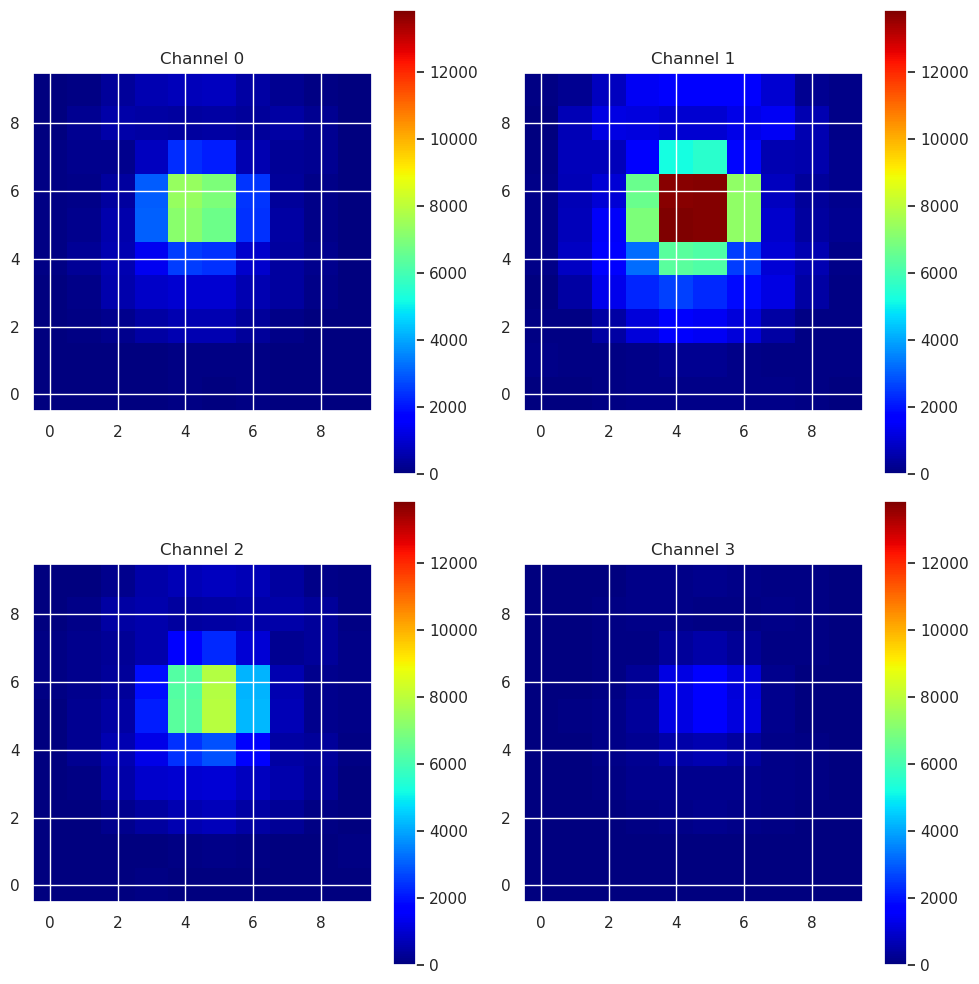

In [5]:
Cred3().check_cropping(subtract_dark=True)

# Calibration

Injection

Scanning injection maps:   0%|          | 0/4 [00:00<?, ?it/s]

  Channel 0 (segment 138): scanning…
Injection OFF on channels [1, 2, 3] (segments [137, 136, 135])


Scanning injection maps:  25%|██▌       | 1/4 [02:32<07:38, 152.76s/it]

Injection OFF on channels [0] (segments [138])
  Channel 1 (segment 137): scanning…
Injection OFF on channels [0, 2, 3] (segments [138, 136, 135])


Scanning injection maps:  50%|█████     | 2/4 [05:25<05:29, 164.61s/it]

Injection OFF on channels [1] (segments [137])
  Channel 2 (segment 136): scanning…
Injection OFF on channels [0, 1, 3] (segments [138, 137, 135])


Scanning injection maps:  75%|███████▌  | 3/4 [07:51<02:36, 156.07s/it]

Injection OFF on channels [2] (segments [136])
  Channel 3 (segment 135): scanning…
Injection OFF on channels [0, 1, 2] (segments [138, 137, 136])


Scanning injection maps: 100%|██████████| 4/4 [10:18<00:00, 154.71s/it]

Injection OFF on channels [3] (segments [135])
Injection FLAT on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])

── Find gross TT for max injection and spread ──
Injection spread of seg=138: (tip, tilt) = (0.72086,0.76573) mrad
Injection spread of seg=137: (tip, tilt) = (0.67874,0.76304) mrad
Injection spread of seg=136: (tip, tilt) = (0.68514,0.74467) mrad
Injection spread of seg=135: (tip, tilt) = (0.70346,0.75181) mrad

── Find precise TT for max injection ──
Injection max of seg=138: (tip, tilt) = (-0.50957,-0.03620) mrad; flux = 1272
Injection max of seg=137: (tip, tilt) = (-0.15089,-0.18684) mrad; flux = 1039
Injection max of seg=136: (tip, tilt) = (0.10352,-0.23856) mrad; flux = 1176
Injection max of seg=135: (tip, tilt) = (0.29693,-0.25088) mrad; flux = 1416
✅ Injection calibration saved to config (injection.max)



── Finding maximum injection points ──

── Balancing injection fluxes ──
  Weakest channel: 1 (seg 137), target flux = 1107
  Dichotomy on channel 0 (seg 138)…
Injection OFF on channels [1, 2, 3] (segments [137, 136, 135])
    → balanced tilt = 0.2314 mrad, flux = 1107 (target 1107), iterations = 19
  Dichotomy on channel 2 (seg 136)…
Injection OFF on channels [0, 1, 3] (segments [138, 137, 135])
    → balanced tilt = 0.2314 mrad, flux = 1107 (target 1107), iterations = 19
  Dichotomy on channel 2 (seg 136)…
Injection OFF on channels [0, 1, 3] (segments [138, 137, 135])
    → balanced tilt = -0.2000 mrad, flux = 1099 (target 1107), iterations = 19
  Dichotomy on channel 3 (seg 135)…
Injection OFF on channels [0, 1, 2] (segments [138, 137, 136])
    → balanced tilt = -0.2000 mrad, flux = 1099 (target 1107), iterations = 19
  Dichotomy on channel 3 (seg 135)…
Injection OFF on channels [0, 1, 2] (segments [138, 137, 136])
    → balanced tilt = 0.0625 mrad, flux = 1106 (target 1107), iter

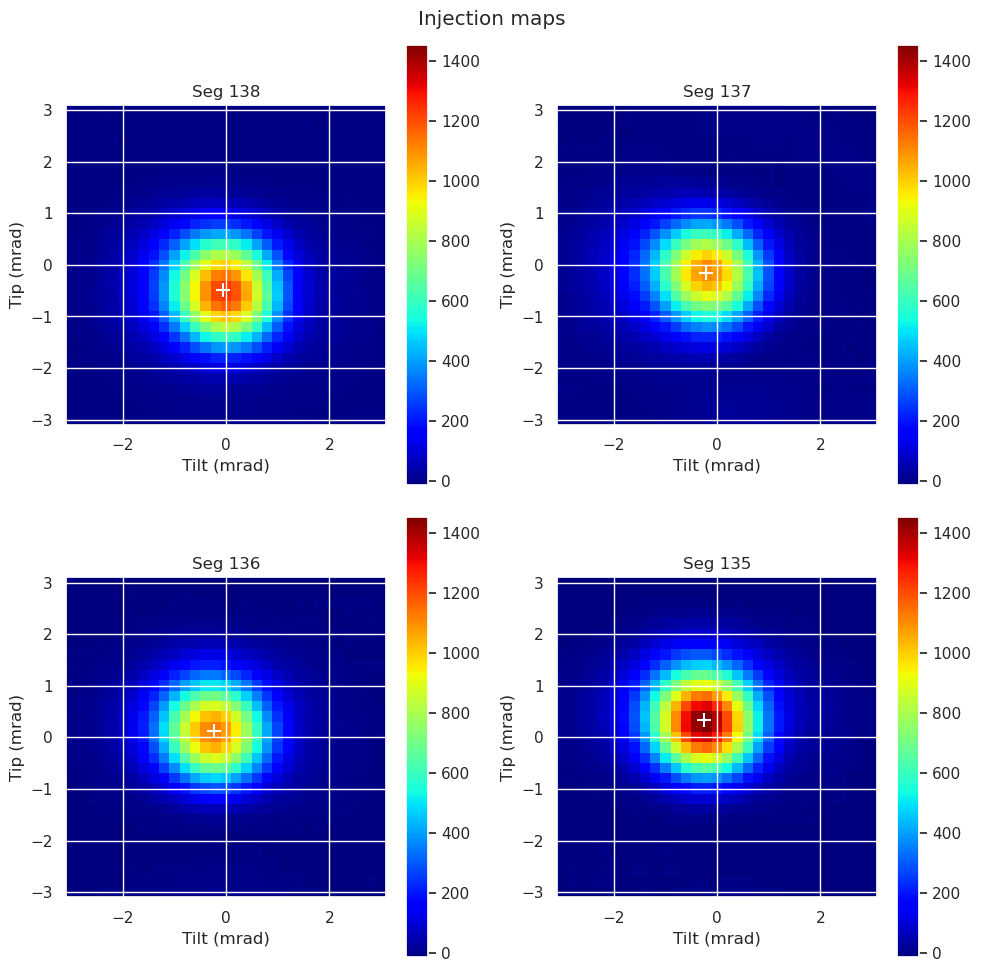

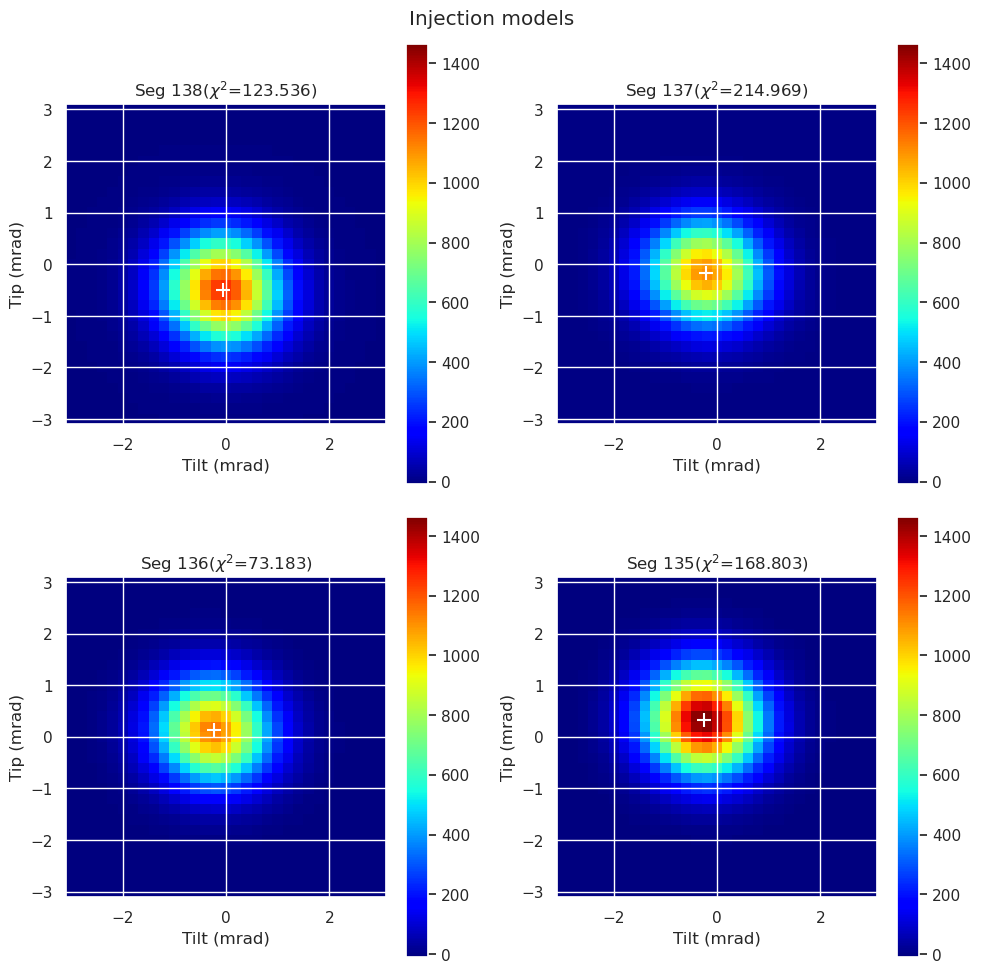

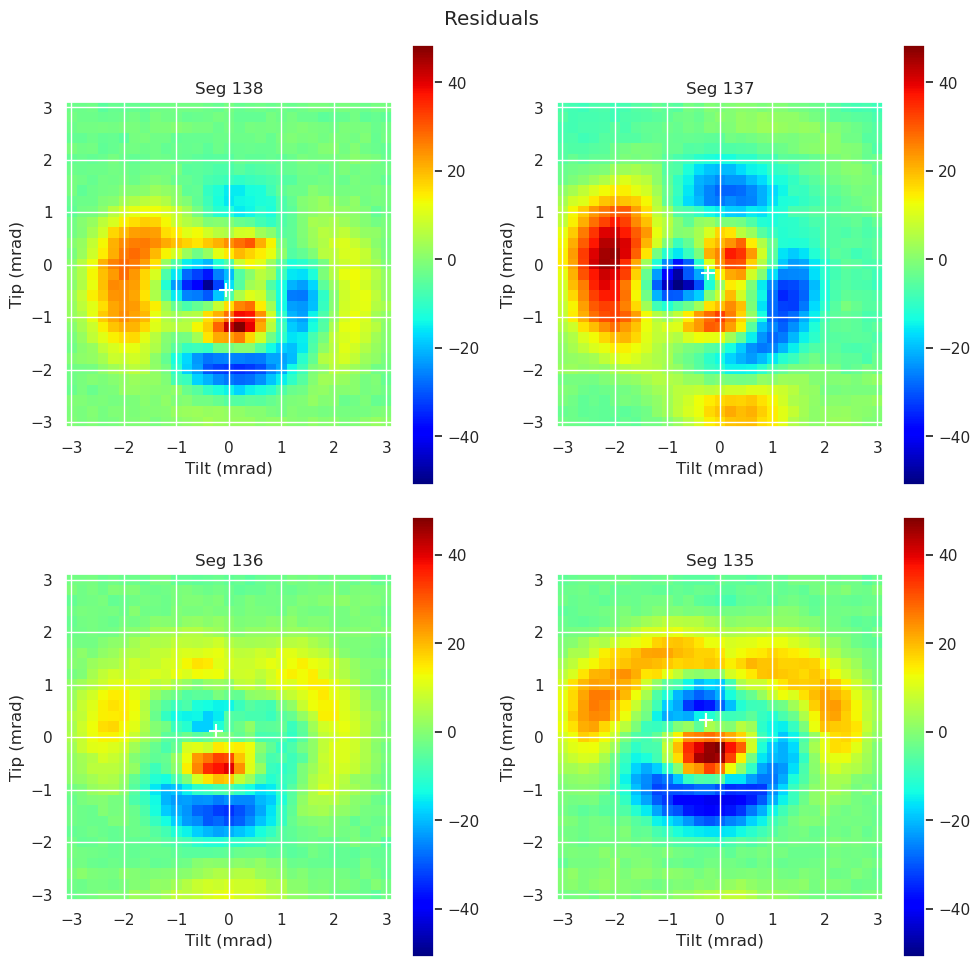

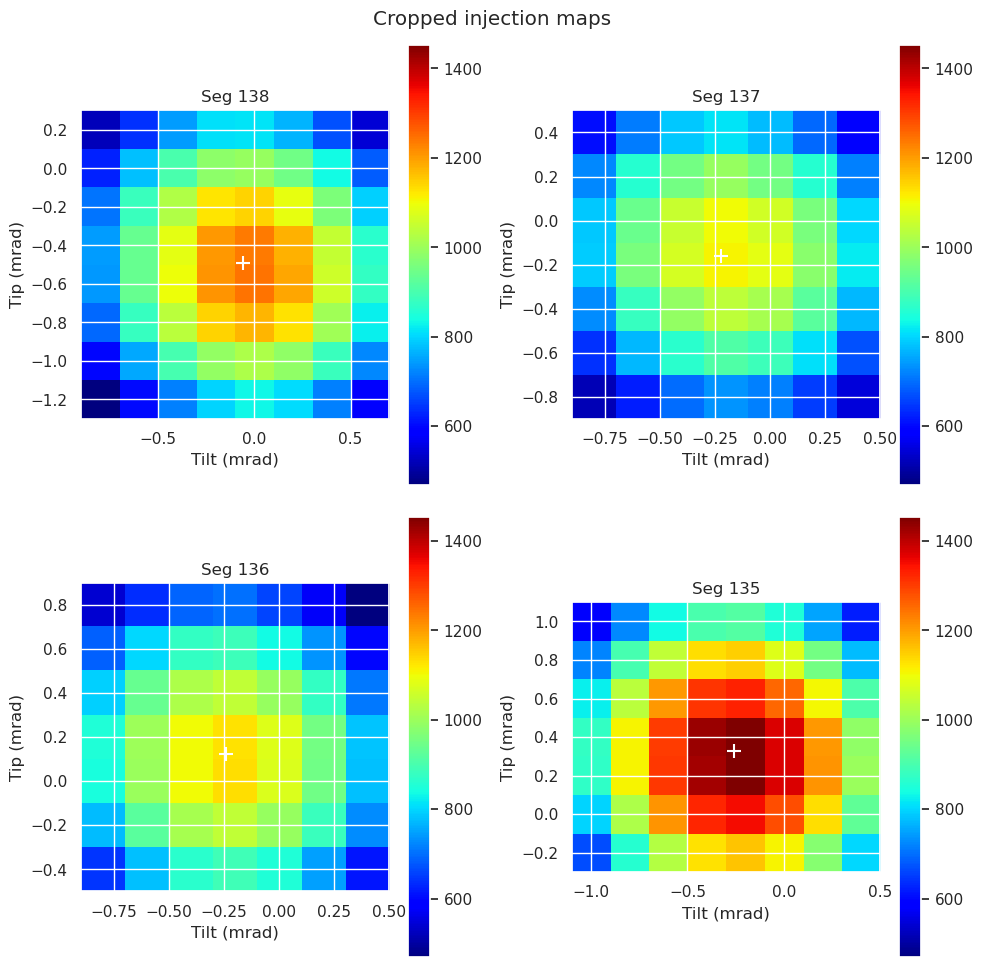

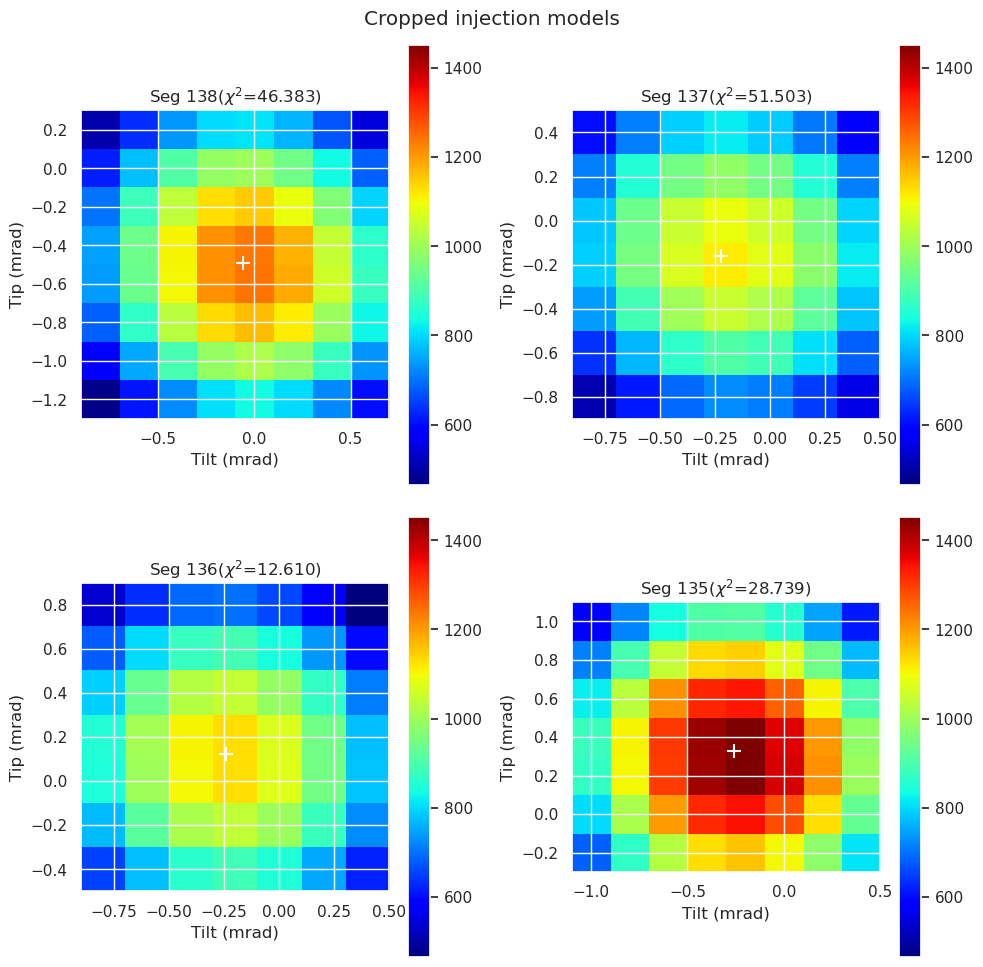

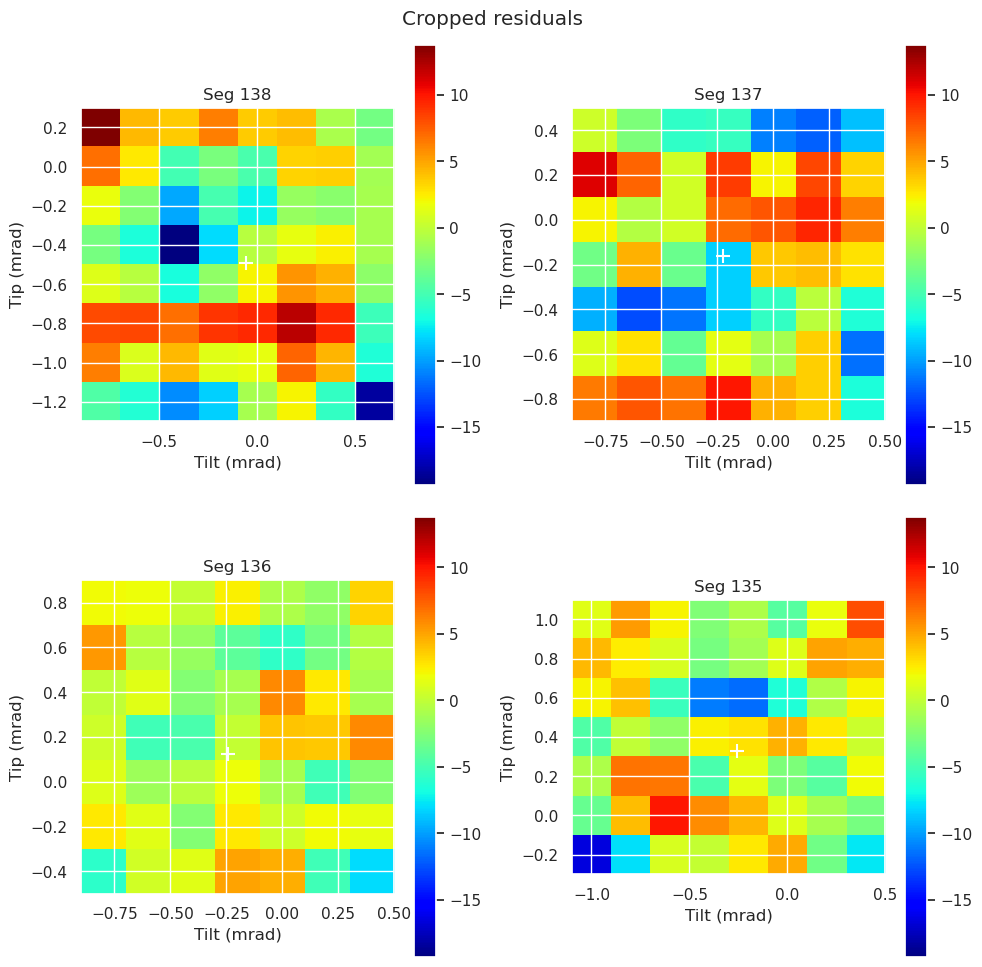

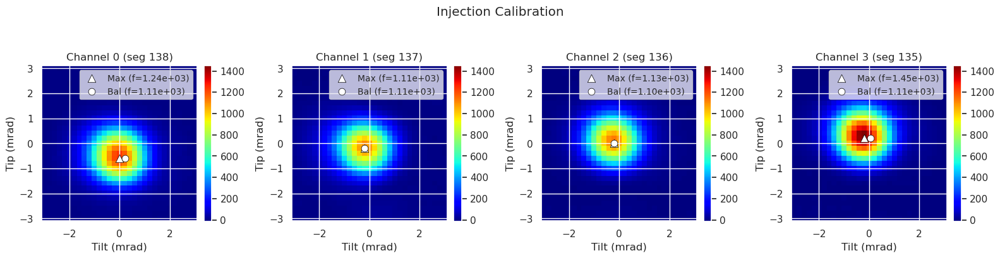

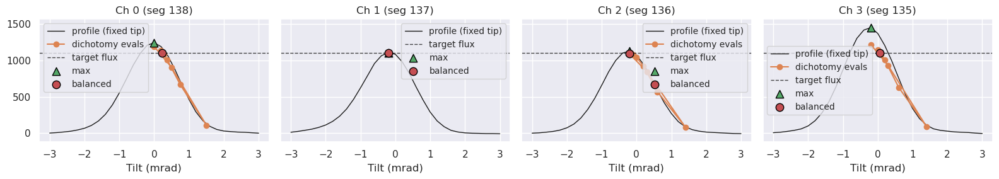

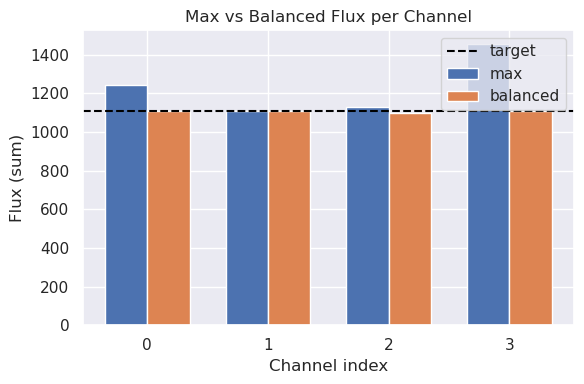

In [6]:
metadata = Injection().calibrate(plot=True, verbose=True, tilt_tol = 1e-5, avg_frames= 5)

for i, fig in enumerate(metadata.get('max_inj', {}).get('fig', [])):
    if fig is not None:
        fig.savefig(path / f"calibration_max_inj_{i}.png", bbox_inches="tight")

bal_figs = metadata.get('bal_data', {}).get('figures', {})
if isinstance(bal_figs, dict):
    for name, fig in bal_figs.items():
        if fig is not None:
            fig.savefig(path / f"calibration_bal_{name}.png", bbox_inches="tight")


Save results

In [7]:
figs = metadata.get('figures', {})
print(figs)
# metadata['figure'].savefig(path / f"injection_maps.png")
#figs.get('dichotomy').savefig(path / f"injection_dichotomy.png")
#figs.get('comparison').savefig(path / f"injection_comparison.png")

Injection().set_balanced()

{}
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


TOPAs

In [8]:
# Check if the shifter is working

arch.shifters[0].set_power(0.6)
cur = arch.shifters[0].get_current()
volt = arch.shifters[0].get_voltage()
pow = arch.shifters[0].get_power()
print(f"Current: {cur} mA, Voltage: {volt} V, Power: {pow*1000} mW")

phobos.XPOW().turn_off()
cur = arch.shifters[0].get_current()
volt = arch.shifters[0].get_voltage()
pow = arch.shifters[0].get_power()
print(f"Current: {cur} mA, Voltage: {volt} V, Power: {pow} W")

Current: 28.448 mA, Voltage: 21.027 V, Power: 598.26144 mW
Current: 0.0 mA, Voltage: 0.0 V, Power: 0.0 W
Current: 0.0 mA, Voltage: 0.0 V, Power: 0.0 W


Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


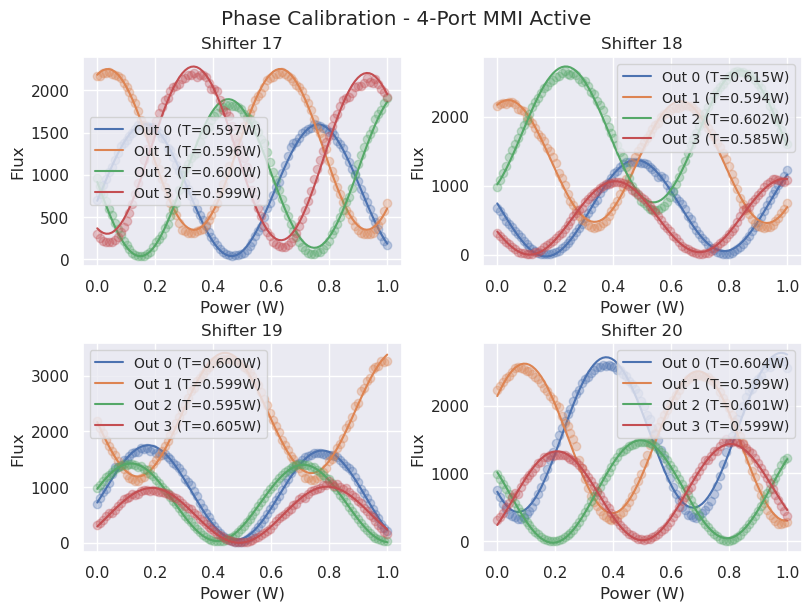

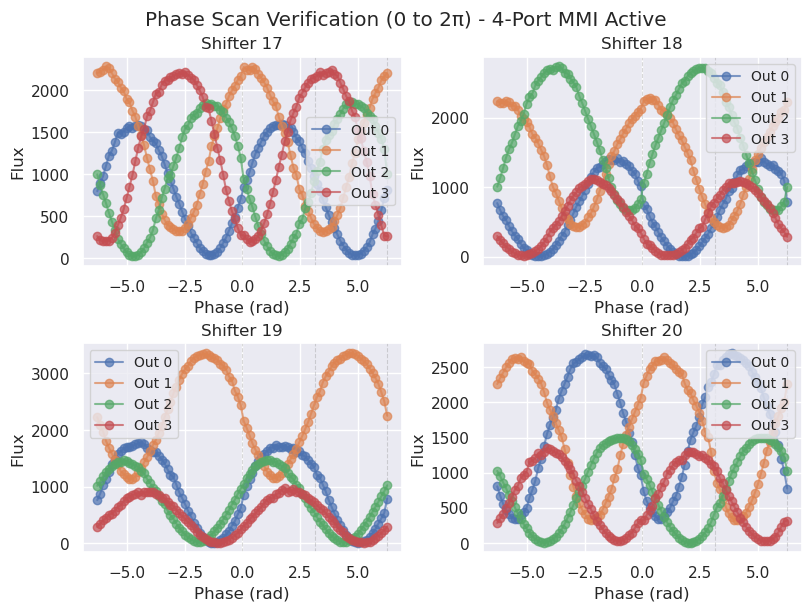

In [11]:
# Setup
Injection().set_balanced()

# Calibration
data, _, _, metadata = arch.phase_calibration(plot=True, return_metadata=True)

# Results
metadata['figure1'].savefig(path / "phase_calibration.png")
metadata['figure2'].savefig(path / "phase_calibration_verification.png")
np.save(path / "phase_calibration.npy", data)

# Stop
phobos.XPOW().turn_off()

---
# Model solving

### Model
$$
O = |C_{out} \cdot M \cdot C_{in} \cdot E|^2
$$

We consider M is perfect and $C_{in} \approx C_{out} \approx I$. Both $C_{in}$ and $C_{out}$ must have a spectral norm <= 1 (we allow a loss of energy).
$E$ is a 4D complex vector for which each element can have 2 complex values: ON and OFF

In [10]:
# MMI transfer function
M = 1/np.sqrt(4) * np.matrix([
    [1,  1,   1, 1],
    [1, -1j,  1j, 1],
    [1, 1j, -1j, 1],
    [1, -1,  -1, 1]
], dtype=complex)

def electric_field_model_ideal(E):
    return M @ E

def intensity_model_ideal(E):
    return np.abs(electric_field_model_ideal(E))**2

### Systematic scan
Setup

In [11]:
Injection().set_balanced()
XPOW().turn_off()

Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


Scan

Scanning active inputs: ()
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [] (segments [])
  [1/64] Shifter 17
  [2/64] Shifter 18
  [3/64] Shifter 19
  [4/64] Shifter 20
Scanning active inputs: (0,)
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [0] (segments [138])
  [5/64] Shifter 17
  [6/64] Shifter 18
  [7/64] Shifter 19
  [8/64] Shifter 20
Scanning active inputs: (1,)
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1] (segments [137])
  [9/64] Shifter 17
  [10/64] Shifter 18
  [11/64] Shifter 19
  [12/64] Shifter 20
Scanning active inputs: (2,)
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2] (segments [136])
  [13/64] Shifter 17
  [14/64] Shifter 18
  [15/64] Shifter 19
  [16/64] Shifter 20
Scanning active inputs: (3,)
Injection OFF on channels [0, 1, 2, 3] (se

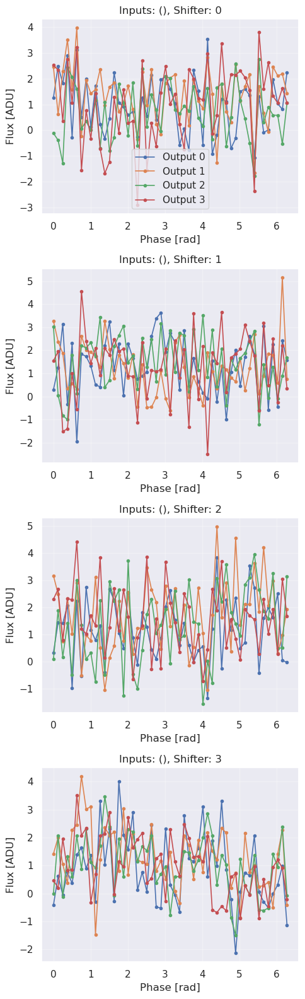

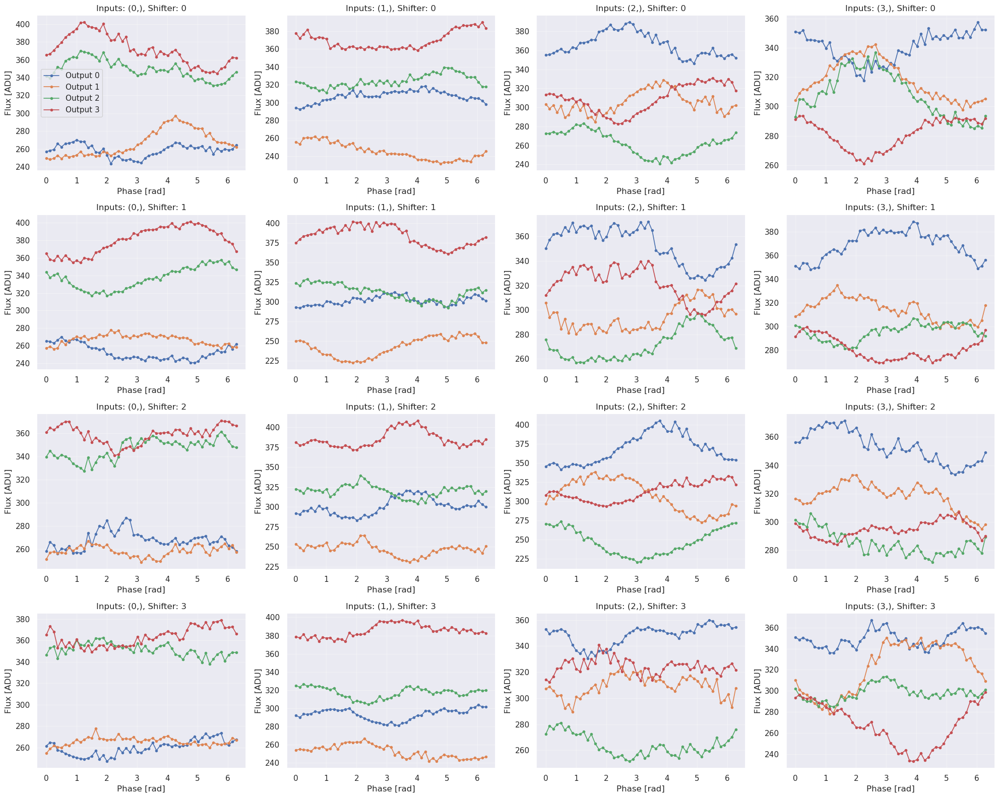

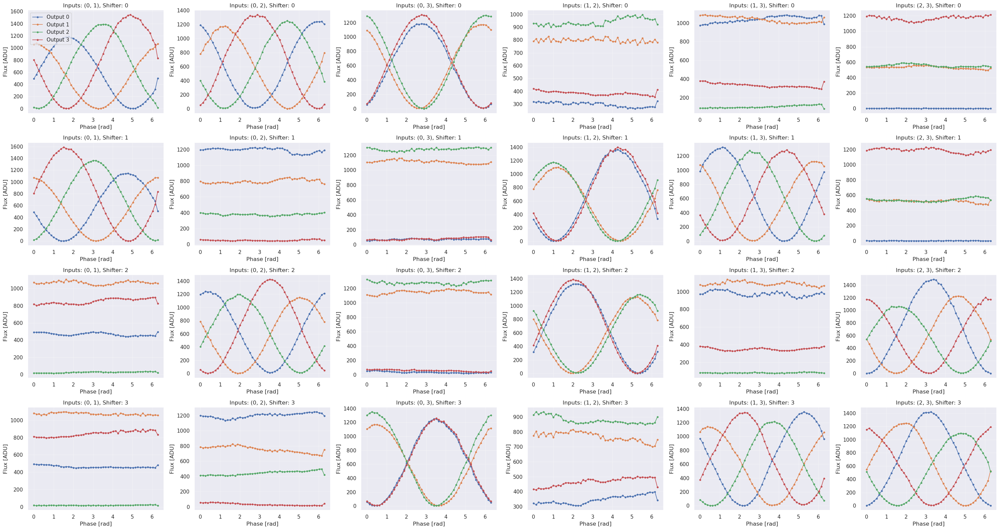

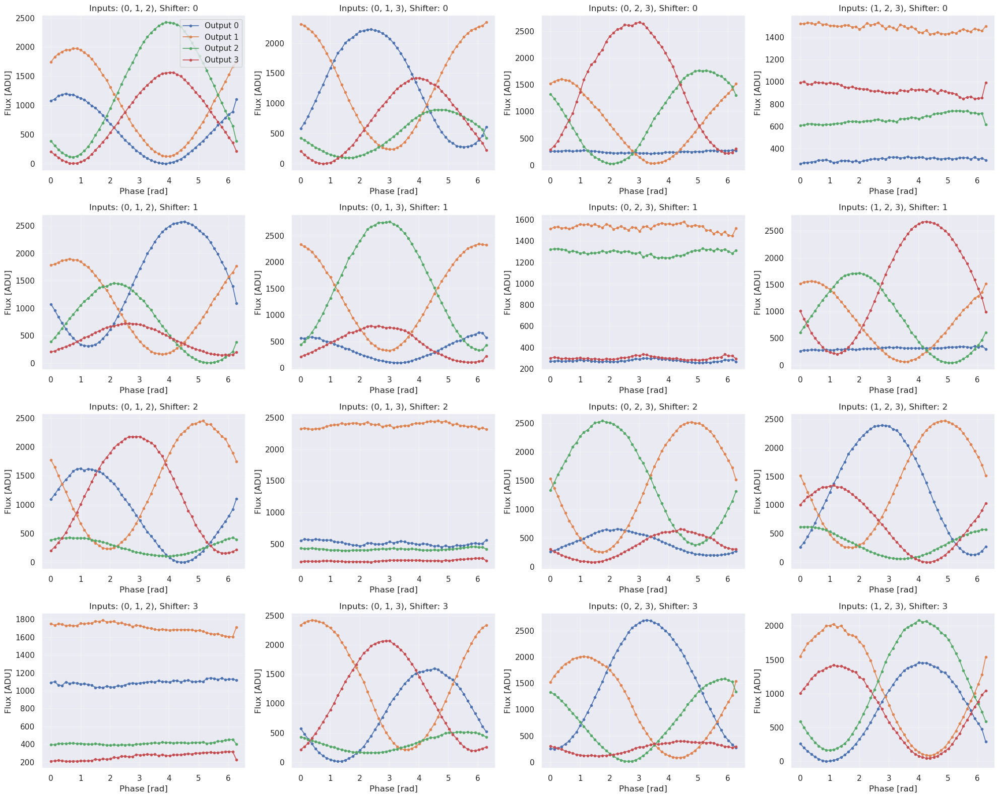

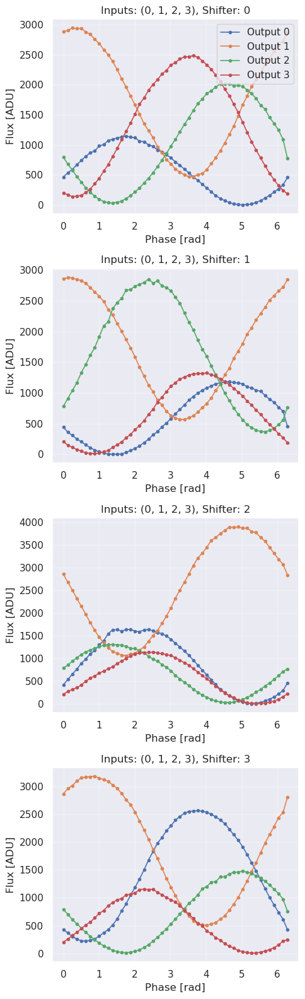

In [12]:
from src.N4x4_T8_characterisation import systematic_scan
data, metadata = systematic_scan.run(arch, plot=True, return_metadata=True)
XPOW().turn_off()

Save results

In [13]:
for figure_name in metadata['figures'].keys():
    metadata['figures'][figure_name].savefig(path / f"systematic_scan_{str(figure_name)}_input.png")

#convert data keys from tuple to str
data_str = {str(k): v for k, v in data.items()}
np.savez(path / "systematic_scan.npz", **data_str)

# Add README
systematic_scan_readme = """
systematic_scan.npz should be read using the `np.load` function :

```python
data = np.load("systematic_scan.npz")
```

The first dimension of the arrays is the shifter index (from 0 to 3), then the output and finally the phase injected
"""

with open(str(path / "systematic_scan_readme.md"), "w") as f:
    f.write(systematic_scan_readme)

<PolarAxes: >

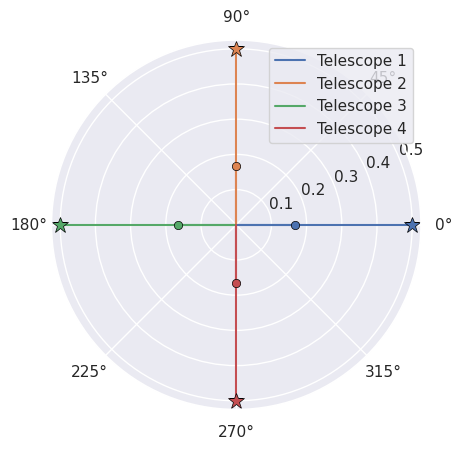

In [14]:
# Test of PHISE laugiergram

import phise
import numpy as np
import matplotlib.pyplot as plt

phasors = 1/np.sqrt(4) * np.array([np.exp(1j*0), np.exp(1j*np.pi/2), np.exp(1j*np.pi), np.exp(-1j*np.pi/2)])

fig, ax = phise.laugiergram(phasors=phasors, labels=[f"Telescope {i}" for i in range(1,5)])

phise.laugiergram(phasors=phasors*np.exp(1j*np.pi/6)/3, ax=ax, marker=".")

In [15]:
M = (1 / np.sqrt(4)) * np.array(
        [[1,   1,  1,  1],
         [1, -1j, 1j, -1],
         [1,  1j,-1j, -1],
         [1,  -1, -1,  1]],
        dtype=complex,
    )

Fit model

In [ ]:
import numpy as np
from pathlib import Path
path = Path("./highlighted_results/2026-03-17_b78b22c/6_N4x4-T8_characterisation")
data = np.load(path / "systematic_scan.npz")
data = {eval(k): v for k, v in data.items()} # str keys to tuple


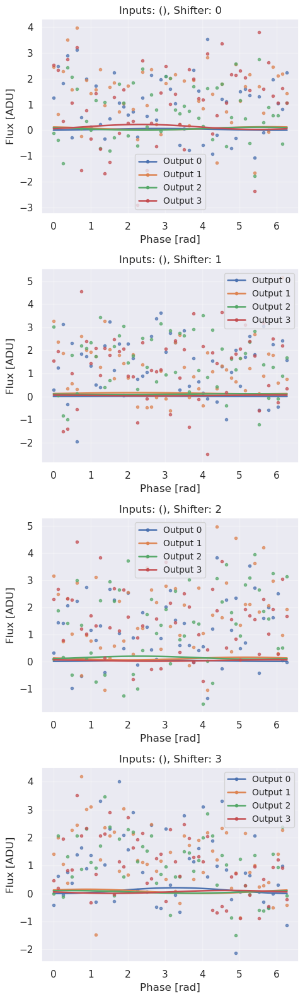

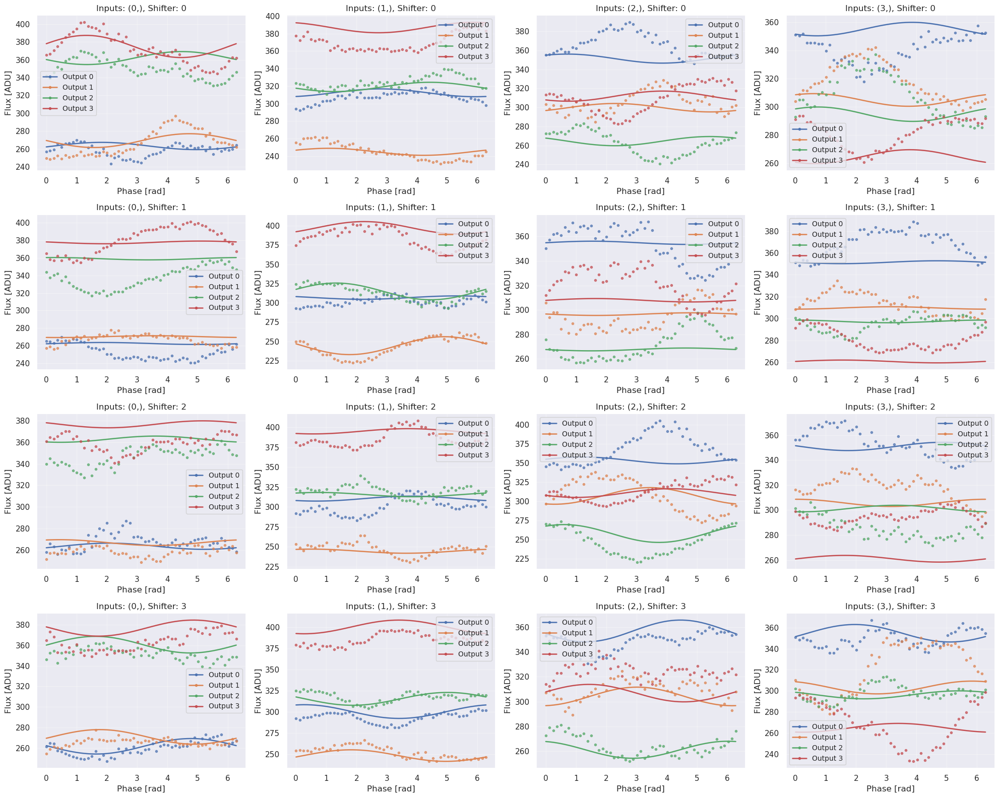

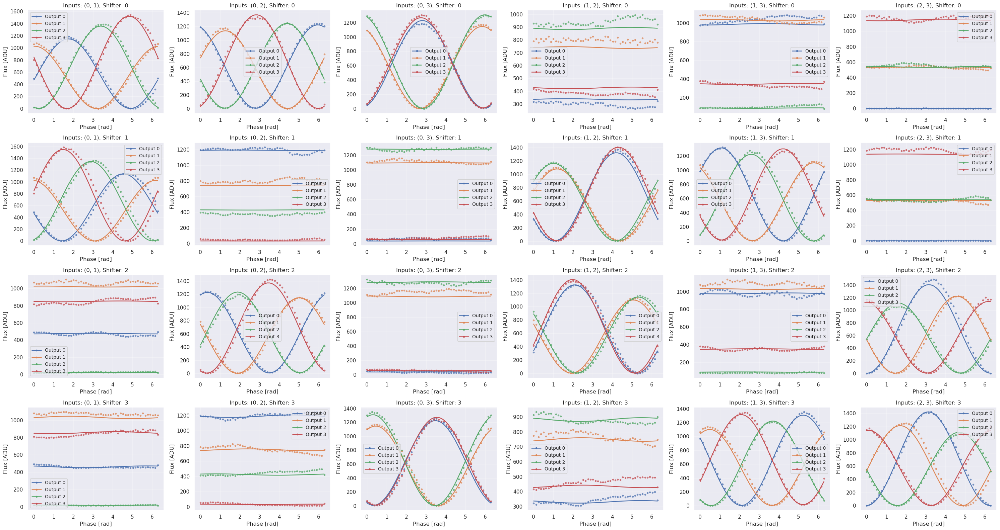

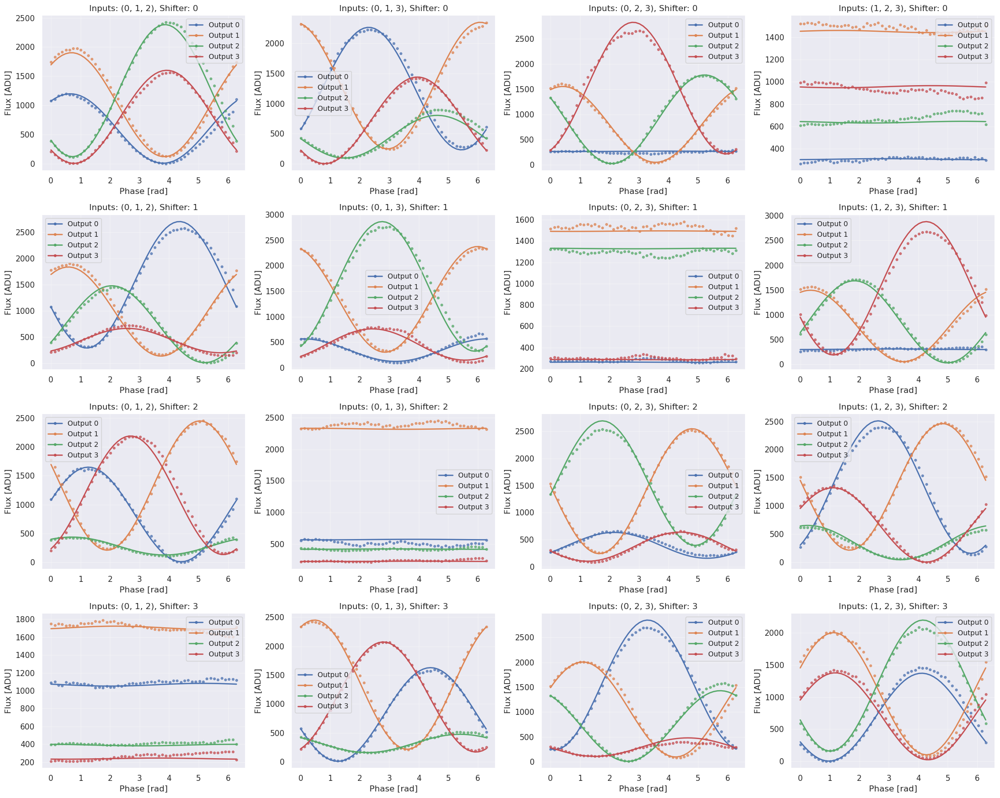

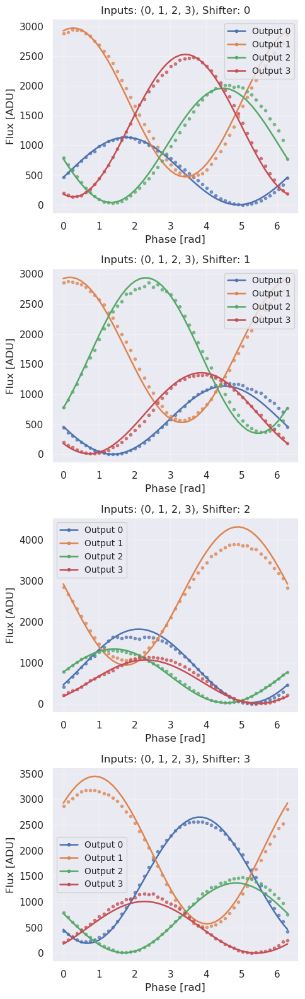

In [17]:
from src.N4x4_T8_characterisation import fit_model
Cout, Cin, Eon, Eoff, metadata = fit_model.fit(data, plot=True, return_metadata=True)

np.savez(path / "Model.npz", M=M, Cin=Cin, Cout=Cout, Ein=Eon, Eout=Eoff)

In [18]:
np.savez(path / "Model.npz", M=M, Cin=Cin, Cout=Cout, Ein=Eon, Eout=Eoff)

Display fitted parameters

In [19]:
from src.utils import latexio
latexio.display_complex_matrix(M, name="M")
latexio.display_complex_matrix(Cin, name="Cin")
latexio.display_complex_matrix(Cout, name="Cout")
latexio.display_complex_vector(Eon, name="Eon")
latexio.display_complex_vector(Eoff, name="Eoff")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Display phasors

In [20]:
import numpy as np
import phise
import matplotlib.pyplot as plt

In [21]:
def phasors(em_model, Ein):
    phasors = []
    for i in range(Ein.shape[0]):
        new_Ein = np.zeros_like(Ein)
        new_Ein[i] = Ein[i]
        out = em_model(new_Ein)
        phasors.append(out) # (input, output)
    return np.array(phasors).T # (output, input)

/tmp/ipykernel_1098750/825988681.py:6: UserWarning: The Figure parameters 'layout' and 'tight_layout' cannot be used together. Please use 'layout' only.
  fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')


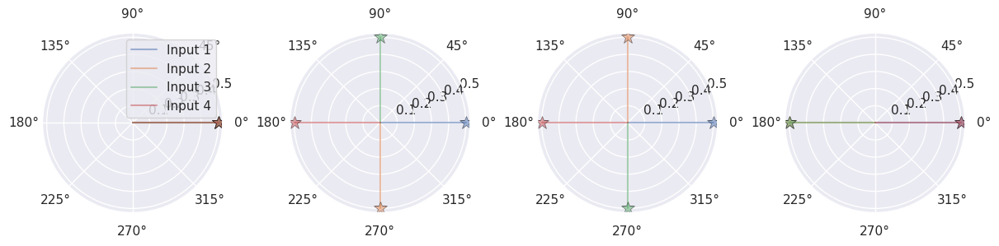

In [22]:
# Ideal
def em_model_ideal(Ein):
    return M @ Ein

phasors_ideal = phasors(em_model_ideal, np.ones(4, dtype=complex))
fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')
for o in range(4):
    phise.laugiergram(phasors=phasors_ideal[o], ax=axs[o], alpha=0.5, labels=[f"Input {i}" for i in range(1,5)] if o==0 else None)
fig.savefig(path / "phasors_ideal.png")

/tmp/ipykernel_1098750/3950082303.py:6: UserWarning: The Figure parameters 'layout' and 'tight_layout' cannot be used together. Please use 'layout' only.
  fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')


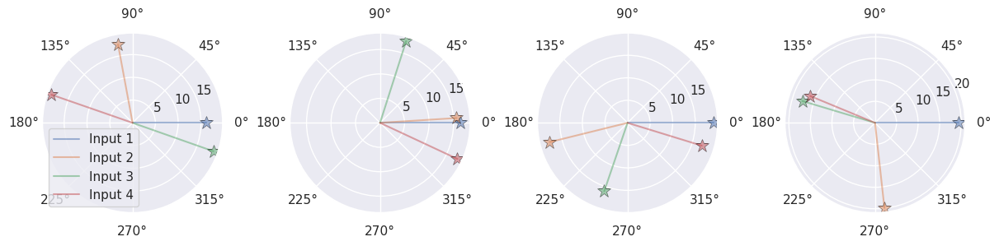

In [23]:
# Raw
def em_model_raw(Ein):
    return Cout @ M @ Cin @ Ein

phasors_raw = phasors(em_model_raw, Eon)
fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')
for o in range(4):
    phise.laugiergram(phasors=phasors_raw[o], ax=axs[o], alpha=0.5, labels=[f"Input {i}" for i in range(1,5)] if o==0 else None)
fig.savefig(path / "phasors_raw.png")

# Null Calibration

Setup

In [12]:
Injection().set_balanced()
XPOW().turn_off()
FilterWheel().move(2)

Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
FILT - Move to position 2
FILT - Move to position 2


Save raw output

In [13]:
meas = []
for _ in range(100):
    meas.append(np.sum(phobos.Cred3().get_outputs(flux_mode='sum')))
total_flux = np.mean(meas)
total_flux

np.float64(446356.52640625)

/tmp/ipykernel_1599800/1209338647.py:5: RuntimeWarning: divide by zero encountered in log
  ax.imshow(np.log(img_before_calib), cmap='jet', vmin=0, vmax=np.percentile(img_before_calib, 99))


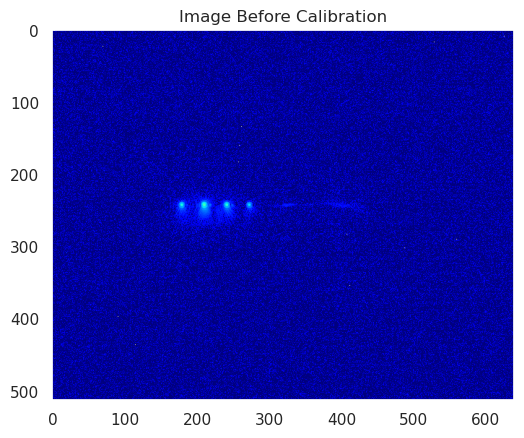

In [14]:
# Save image before calibration
img_before_calib = phobos.Cred3().get_image()
img_before_calib[img_before_calib < 0] = 1e-10  # Avoid log of zero
fig, ax = plt.subplots()
ax.imshow(np.log(img_before_calib), cmap='jet', vmin=0, vmax=np.percentile(img_before_calib, 99))
ax.grid(False)
ax.set_title('Image Before Calibration')
fig.savefig(path / "outputs_before_calibration.png")
np.save(path / "outputs_before_calibration.npy", img_before_calib)

🧬 Starting Genetic Calibration for Arch6...
✅ Genetic calibration complete in 44 iterations.
✅ Genetic calibration complete in 44 iterations.


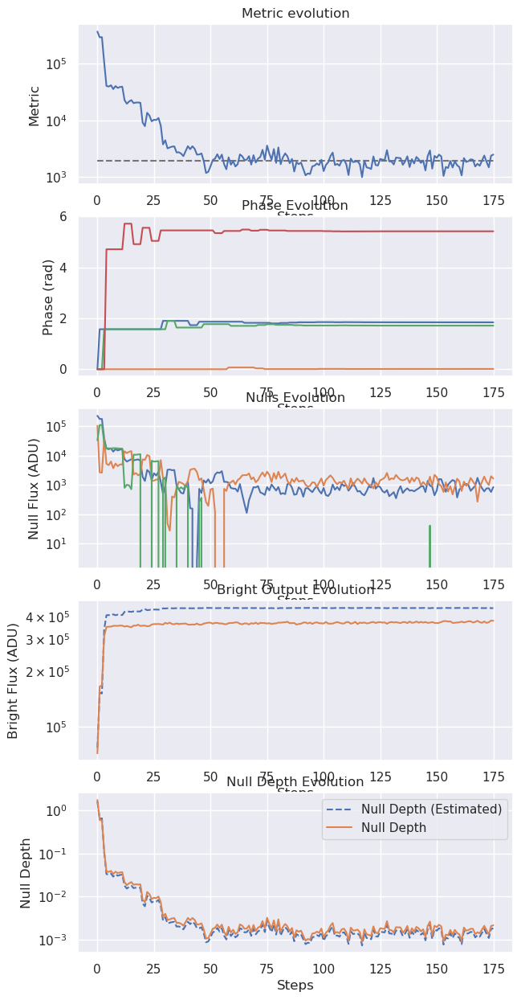

In [15]:
# Calibrate null
bright_output=0
calibration_res = phobos.Arch6().null_calibration_gen(bright_output=bright_output, use_dm=False, plot=True, total_flux=total_flux, figsize=(7, 15), avg_frames=5)
phases = calibration_res['phases']
# Save results
calibration_res['figure'].savefig(path / "null_calibration.png")
np.savez(path / "null_calibration.npz", phases=phases, phases_evol=calibration_res['phases_evol'], depth_evol=calibration_res['depth_evol'])

/tmp/ipykernel_1098750/3098439142.py:5: RuntimeWarning: divide by zero encountered in log
  ax.imshow(np.log(img_after_calib), cmap='jet', vmin=0, vmax=np.percentile(img_after_calib, 99))


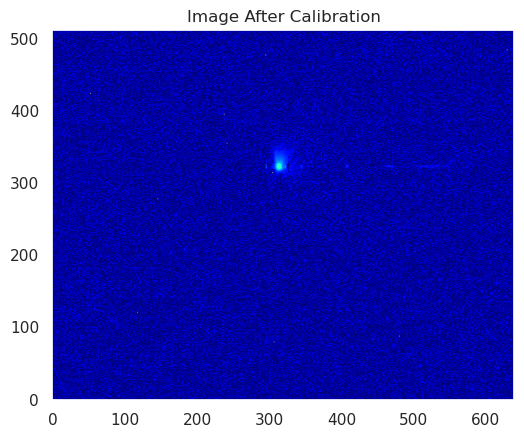

In [ ]:
# Save image after calibration
img_after_calib = phobos.Cred3().get_image()
img_after_calib[img_after_calib < 0] = 1e-10  # Avoid log of zero
fig, ax = plt.subplots()
ax.imshow(np.log(img_after_calib), cmap='jet', vmin=0, vmax=np.percentile(img_after_calib, 99))
ax.grid(False)
ax.set_title('Image After Calibration')
fig.savefig(path / "outputs_after_calibration.png")
np.save(path / "outputs_after_calibration.npy", img_after_calib)
XPOW().turn_off()

/tmp/ipykernel_1098750/2152880089.py:3: UserWarning: The Figure parameters 'layout' and 'tight_layout' cannot be used together. Please use 'layout' only.
  fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')


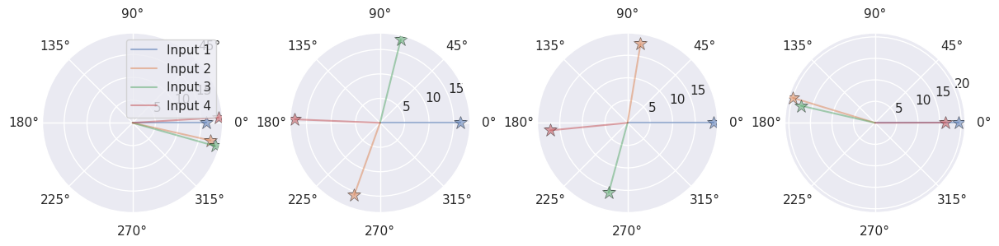

In [ ]:
# Calibrated phasors
phasors_calibrated = phasors(em_model_raw, Eon * np.exp(1j*phases))
fig, axs = plt.subplots(1, 4, figsize=(12,3), tight_layout=True, subplot_kw={'projection': 'polar'}, layout='constrained')
for o in range(4):
    phise.laugiergram(phasors=phasors_calibrated[o], ax=axs[o], alpha=0.5, labels=[f"Input {i}" for i in range(1,5)] if o==0 else None)
fig.savefig(path / "phasors_calibrated.png")

In [ ]:
phobos.Arch6().set_phases(phases)
print(phobos.Cred3().get_outputs(flux_mode='sum'))
XPOW().turn_off()

[4.06959000e+05 1.31186450e+03 2.71200439e+02 6.98265747e+02]


In [31]:

def get_distrib(N=1000, rms=0):
    phobos.Arch6().set_phases(phases)
    Injection().set_balanced()

    outs = np.zeros((N, 4))
    kernel = np.zeros((N,))
    for i in range(N):
        for channel, tt in enumerate(Config().get('injection.balanced')):
            ptt = [DM().mid_piston, *tt]
            seg = Injection()._parse_channels(channel)[0]
            ptt[0] += np.random.normal(0, rms)  # Add noise to DM commands
            phobos.Segment(int(seg)).set_ptt(*ptt)
        outs[i] = phobos.Cred3().get_outputs(flux_mode='sum')
        kernel[i] = outs[i,(bright_output+1)%4] - outs[i,(bright_output+2)%4]

    # Histograms
    import matplotlib.pyplot as plt
    distribution_fig, axs = plt.subplots(1, 5, figsize=(20, 5), tight_layout=True)
    axs[0].hist(outs[:,bright_output], bins=30, color='blue', alpha=0.7)
    axs[0].set_title('Bright')
    axs[1].hist(outs[:,(bright_output+1)%4], bins=30, color='orange', alpha=0.7)
    axs[1].set_title('Dark 1')
    axs[2].hist(outs[:,(bright_output+2)%4], bins=30, color='green', alpha=0.7)
    axs[2].set_title('Dark 2')
    axs[3].hist(outs[:,(bright_output+3)%4], bins=30, color='red', alpha=0.7)
    axs[3].set_title('Null')
    axs[4].hist(kernel, bins=30, color='purple', alpha=0.7)
    axs[4].set_title('Kernel')
    for ax in axs:
        ax.set_xlabel('Integrated flux (ADU)')
        ax.set_ylabel('Occurrences')
    plt.show()

    print("Median of null depth:")
    bright = np.median(outs[:,2])
    null = np.median(outs[:,1])
    dark_1 = np.median(outs[:,0])
    dark_2 = np.median(outs[:,3])
    kernel_med = np.median(kernel)
    print(f"   Null: {null/bright:.2e}")
    print(f"   Dark 1: {dark_1/bright:.2e}")
    print(f"   Dark 2: {dark_2/bright:.2e}")
    print(f"   Kernel: {kernel_med/bright:.2e}")

    # Combine kernels and outs
    distribs = np.hstack((outs, kernel.reshape(-1, 1)))
    return distribs


RMS Noise: 0 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


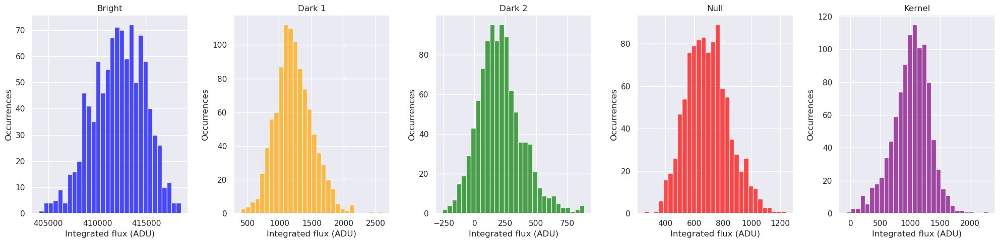

Median of null depth:
   Null: 6.17e+00
   Dark 1: 2.12e+03
   Dark 2: 3.52e+00
   Kernel: 5.35e+00

RMS Noise: 1 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


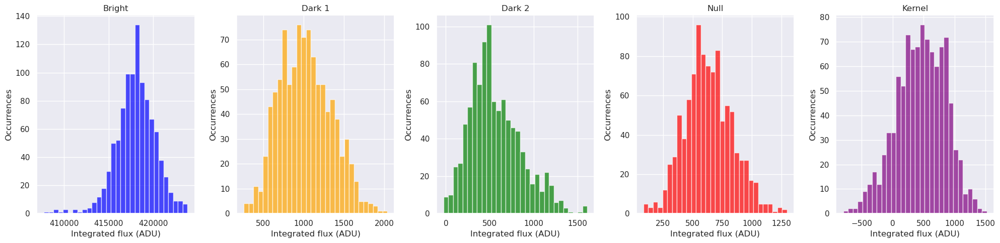

Median of null depth:
   Null: 1.98e+00
   Dark 1: 8.23e+02
   Dark 2: 1.21e+00
   Kernel: 9.29e-01

RMS Noise: 2 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


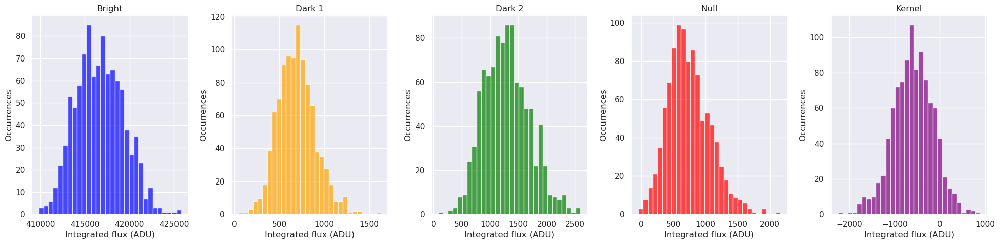

Median of null depth:
   Null: 5.39e-01
   Dark 1: 3.29e+02
   Dark 2: 5.58e-01
   Kernel: -4.73e-01

RMS Noise: 5 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


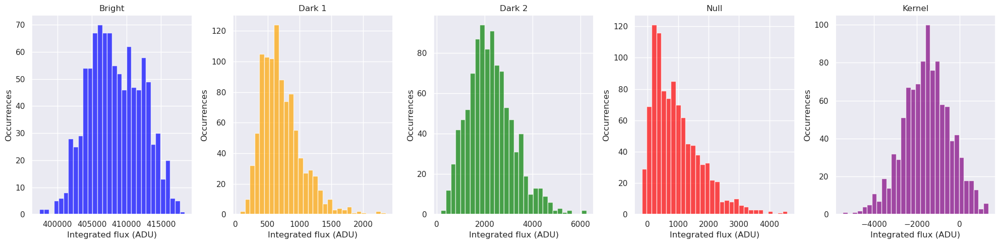

Median of null depth:
   Null: 3.03e-01
   Dark 1: 1.88e+02
   Dark 2: 3.62e-01
   Kernel: -7.13e-01

RMS Noise: 10 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


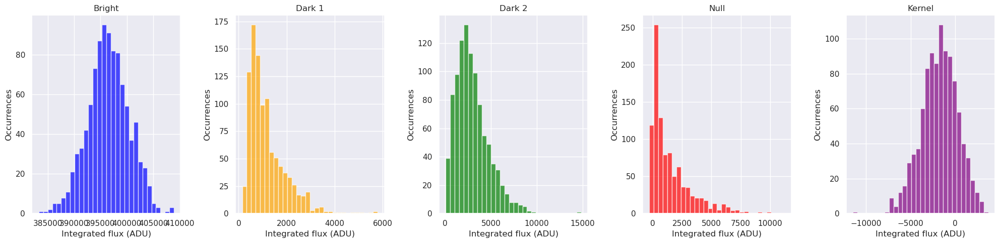

Median of null depth:
   Null: 3.65e-01
   Dark 1: 1.53e+02
   Dark 2: 3.34e-01
   Kernel: -6.36e-01

RMS Noise: 20 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


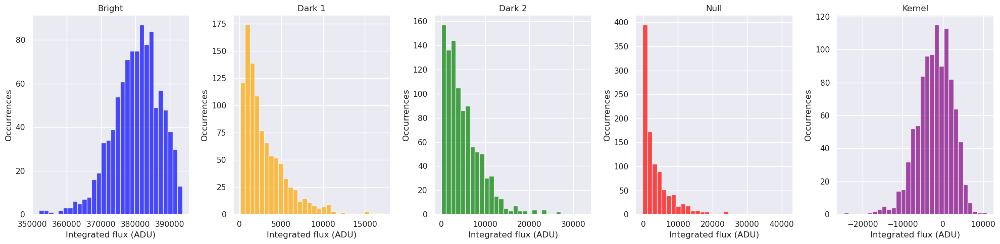

Median of null depth:
   Null: 5.49e-01
   Dark 1: 9.75e+01
   Dark 2: 4.79e-01
   Kernel: -4.45e-01

RMS Noise: 50 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


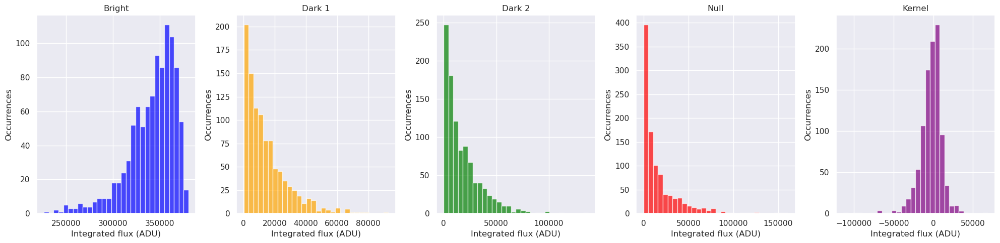

Median of null depth:
   Null: 8.69e-01
   Dark 1: 2.90e+01
   Dark 2: 6.65e-01
   Kernel: -1.59e-01

RMS Noise: 100 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


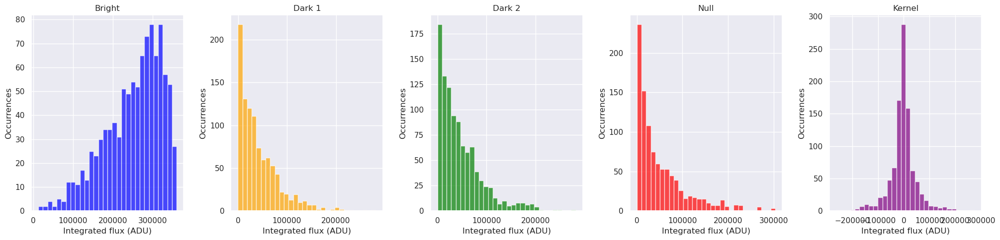

Median of null depth:
   Null: 8.95e-01
   Dark 1: 7.82e+00
   Dark 2: 9.13e-01
   Kernel: -4.31e-02

RMS Noise: 200 nm
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


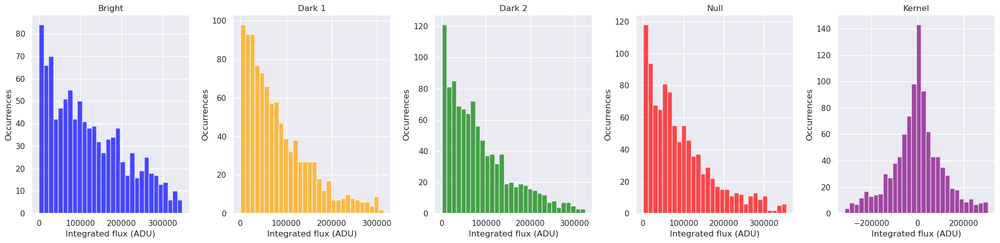

Median of null depth:
   Null: 9.34e-01
   Dark 1: 1.51e+00
   Dark 2: 1.06e+00
   Kernel: -1.97e-03


In [32]:
rms_values = [0, 1, 2, 5, 10, 20, 50, 100, 200]

distribs = []
for rms in rms_values:
    print(f"\nRMS Noise: {rms} nm")
    distrib = get_distrib(N=1000, rms=rms)
    distribs.append(distrib)

XPOW().turn_off()

In [33]:
XPOW().turn_off()

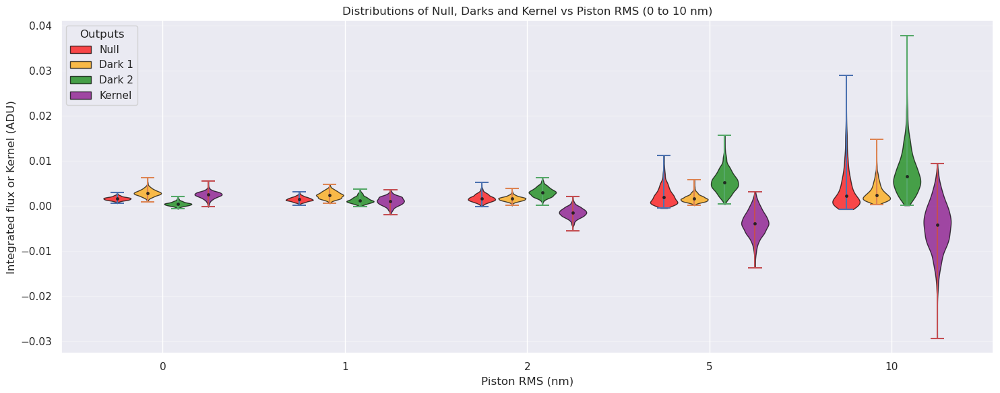

In [34]:
# Violin plots of distributions vs piston RMS for Bright, Null, Dark1, Dark2 and Kernel
# Uses `distribs` and `rms_values` produced by previous cells, and `bright_output` defined earlier.

# Map outputs
bright_idx = bright_output
dark1_idx = (bright_idx + 1) % 4
dark2_idx = (bright_idx + 2) % 4
null_idx  = (bright_idx + 3) % 4
kernel_idx = 4  # last column in distribs is the kernel

# We group Null, Dark 1, Dark 2 and Kernel
output_map = [
    ("Null", null_idx, 'red'),
    ("Dark 1", dark1_idx, 'orange'),
    ("Dark 2", dark2_idx, 'green'),
    ("Kernel", kernel_idx, 'purple'),
]

# Paramètre pour ne garder que les 'n' premiers régimes
# rms_values vaut [0, 1, 2, 5, 10, 20, 50, 100, 200]
# Pour s'arrêter à 20nm, on prend les 6 premiers éléments.
n_max_regimes = 5
plot_rms_values = rms_values[:n_max_regimes]
plot_distribs = distribs[:n_max_regimes]

eps = 1e-12  # to avoid log(0) issues if using log scale
n_rms = len(plot_rms_values)
n_outputs = len(output_map)

fig, ax = plt.subplots(figsize=(15, 6))

# On ajoute un espacement (spacing) > 1 pour mieux séparer chaque groupe de RMS
spacing = 1.5
positions = np.arange(n_rms) * spacing
group_width = 1.0  # Largeur totale du groupe de violons pour un même RMS
width = group_width / n_outputs
offsets = np.linspace(-width * (n_outputs - 1) / 2, width * (n_outputs - 1) / 2, n_outputs)

legend_handles = []
legend_labels = []

for j, (name, idx, color) in enumerate(output_map):
    series = [d[:, idx] / d[:,bright_idx] + eps for d in plot_distribs]
    pos = positions + offsets[j]
    
    parts = ax.violinplot(series, positions=pos, showmeans=False, showmedians=False, widths=width*0.9)
    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)
        
    # Overlay median
    medians = [np.median(s) for s in series]
    ax.plot(pos, medians, marker='.', color='k', linestyle='', markersize=5, alpha=0.8)
    
    legend_handles.append(plt.Rectangle((0,0),1,1, fc=color, edgecolor='black', alpha=0.7))
    legend_labels.append(name)

ax.set_xticks(positions)
ax.set_xticklabels(plot_rms_values)
ax.set_xlabel('Piston RMS (nm)')
ax.set_ylabel('Integrated flux or Kernel (ADU)')
ax.grid(axis='y', alpha=0.3)
ax.legend(legend_handles, legend_labels, title="Outputs", loc='upper left')

plt.title(f'Distributions of Null, Darks and Kernel vs Piston RMS (0 to {plot_rms_values[-1]} nm)')
plt.tight_layout()
fig.savefig(path / "distributions_vs_rms.png")
plt.show()

---
# Spectral characterization

In [35]:
def measure_spectral_characterization(wavelengths, phases, bright_output=0, N_meas=100):
    """
    Mesure la profondeur de null pour les différentes sorties en fonction de la longueur d'onde.
    
    Paramètres:
    - wavelengths: Liste des longueurs d'ondes à tester (en nm)
    - phases: Liste des phases à appliquer (calibrées, en radian)
    - bright_output: Index de la sortie Bright
    - N_meas: Nombre de mesures (frames) par longueur d'onde
    """
    # Application des phases et préparation
    phobos.Arch6().set_phases(phases)
    Injection().set_balanced()
    
    bright_idx = bright_output
    dark1_idx = (bright_idx + 1) % 4
    dark2_idx = (bright_idx + 2) % 4
    null_idx  = (bright_idx + 3) % 4
    
    outputs_names = ['Null', 'Dark 1', 'Dark 2', 'Kernel']
    
    # Dictionnaire pour stocker les résultats, en calculant moyenne et écart type
    results = {name: {'mean': [], 'std': []} for name in outputs_names}
    
    print("Début de la caractérisation spectrale...")
    
    for wl in wavelengths:
        input(f"Ajustez le laser à **{wl} nm** puis appuyez sur Entrée...")
        print(f"Mesure pour {wl} nm en cours...")
        
        outs = np.zeros((N_meas, 4))
        kernel = np.zeros(N_meas)
        
        for i in range(N_meas):
            # Mesure brute
            outs[i] = phobos.Cred3().get_outputs(flux_mode='sum')
            kernel[i] = outs[i, dark1_idx] - outs[i, dark2_idx]
            
        bright = outs[:, bright_idx]
        bright[bright == 0] = 1e-12 # Éviter la division par 0
        
        # Calcul des profondeurs relatives au bright
        depths = {
            'Null': outs[:, null_idx] / bright,
            'Dark 1': outs[:, dark1_idx] / bright,
            'Dark 2': outs[:, dark2_idx] / bright,
            'Kernel': kernel / bright
        }
        
        # Statistiques (Moyenne et Ecart type)
        for name in outputs_names:
            results[name]['mean'].append(np.mean(depths[name]))
            results[name]['std'].append(np.std(depths[name]))
            
    # Conversion lists en arrays
    for name in results:
        for stat in results[name]:
            results[name][stat] = np.array(results[name][stat])
            
    return results

wl_list = [1535, 1540, 1545, 1550, 1555, 1560, 1565]
res = measure_spectral_characterization(wl_list, phases=phases, bright_output=bright_output, N_meas=100)
XPOW().turn_off()

Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Début de la caractérisation spectrale...
Mesure pour 1535 nm en cours...
Mesure pour 1540 nm en cours...
Mesure pour 1545 nm en cours...
Mesure pour 1550 nm en cours...
Mesure pour 1555 nm en cours...
Mesure pour 1560 nm en cours...
Mesure pour 1565 nm en cours...


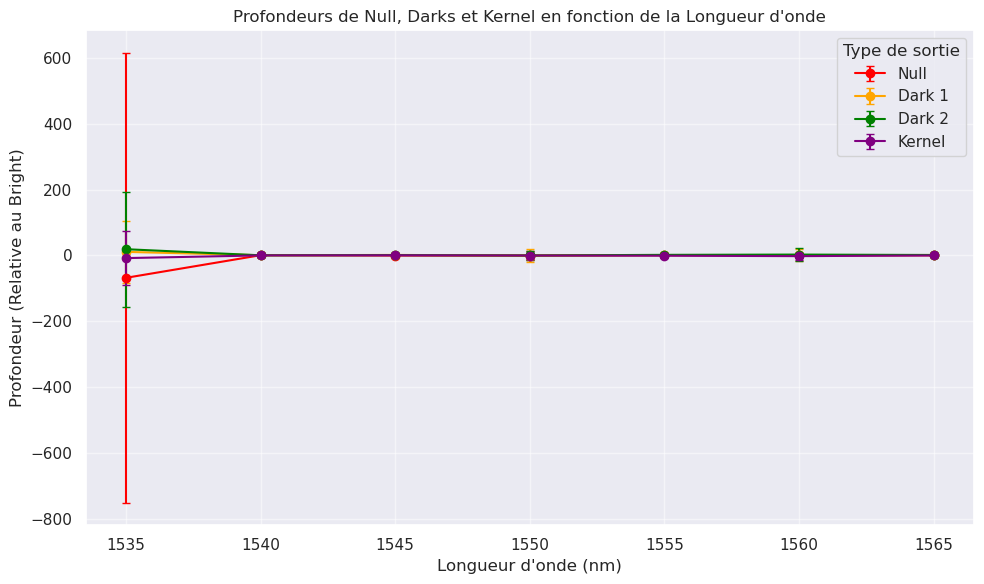

In [39]:
def plot_spectral_characterization(wavelengths, results, save_path=None):
    """
    Affiche les profondeurs de null avec l'écart type en barre d'erreur.
    """
    colors = {
        'Null': 'red',
        'Dark 1': 'orange',
        'Dark 2': 'green',
        'Kernel': 'purple'
    }
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for name, color in colors.items():
        if name in results:
            mean = results[name]['mean']
            std = results[name]['std']
            
            # errorbar trace un point, relie les valeurs et affiche les barres d'erreur
            ax.errorbar(wavelengths, mean, yerr=std, fmt='-o', label=name, color=color, capsize=3)
            
    ax.set_xlabel("Longueur d'onde (nm)")
    ax.set_ylabel("Profondeur (Relative au Bright)")
    ax.set_title("Profondeurs de Null, Darks et Kernel en fonction de la Longueur d'onde")
    ax.grid(True, alpha=0.5, which="both")
    ax.legend(title="Type de sortie")
    
    plt.tight_layout()
    
    if save_path:
        fig.savefig(save_path / "spectral_characterization.png")
        
    plt.show()
    
    return fig

fig = plot_spectral_characterization(wl_list, res, save_path=path)

In [37]:
res

{'Null': {'mean': array([-67.92033289,   0.84609275,  -0.17602354,  -0.43999724,
           0.93583329,   0.20366975,   0.5057524 ]),
  'std': array([684.12019023,   5.97289951,   7.80153951,  12.83545082,
           6.6793015 ,   6.5381316 ,   4.92819253])},
 'Dark 1': {'mean': array([10.92223729,  0.62915306,  1.59769304, -0.20421341,  1.05867742,
          0.64465135,  1.40662883]),
  'std': array([93.34554437,  5.88375461,  5.45409651, 20.59922657,  4.91843413,
         18.62775849,  4.72444862])},
 'Dark 2': {'mean': array([18.97376859,  0.44804979,  1.14693552, -0.04841419,  1.82916493,
          2.68963954,  1.41675   ]),
  'std': array([175.4617843 ,   4.66092975,   2.30356796,  12.60558553,
           3.30341355,  20.23766826,   4.423995  ])},
 'Kernel': {'mean': array([-8.0515313 ,  0.18110327,  0.45075752, -0.15579922, -0.7704875 ,
         -2.04498819, -0.01012117]),
  'std': array([82.21544783,  3.38584073,  5.840081  , 11.66367347,  4.56162147,
         10.95392719,  2.14

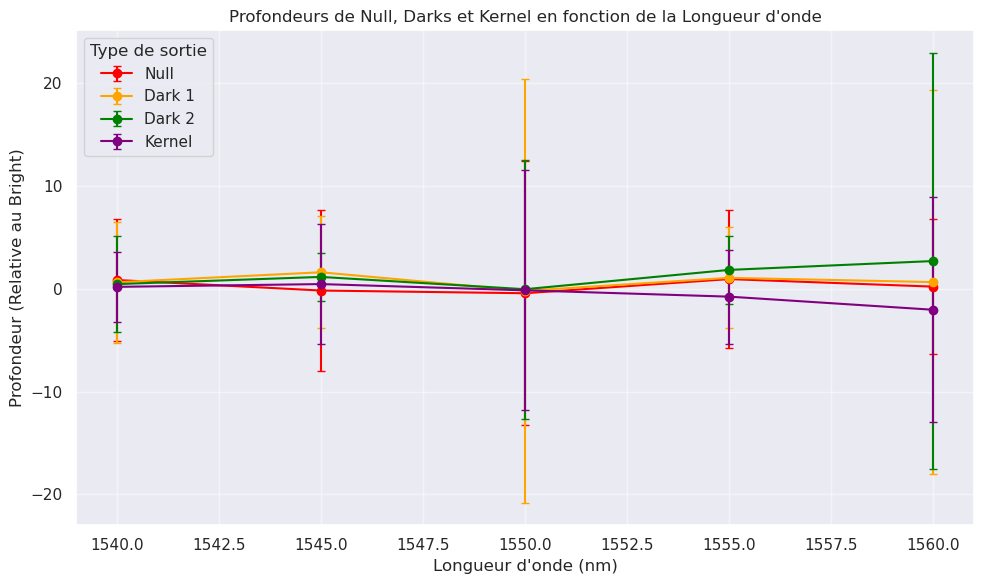

In [42]:
from copy import deepcopy as copy
res2 = copy(res)
for output, values in res.items():
    for stat, v in values.items():
        res2[output][stat] = v[1:-1]

fig = plot_spectral_characterization(wl_list[1:-1], res2, save_path=path)

$$
\vec{I} = \left| \mathbf{C_{out}} \cdot \mathbf{M} \cdot \mathbf{P} \cdot \mathbf{C_{in}} \cdot \vec{E_\text{in}} \right|^2
$$



$$
\begin{pmatrix}
I_{1} \\
I_{2} \\
I_{3} \\
I_{4} \\
\end{pmatrix} = \left|
\begin{pmatrix}
    a_{o,11}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{o,11}}} & a_{o,12}\mathrm{e}^{\mathrm{i}\theta_{o,12}} & a_{o,13}\mathrm{e}^{\mathrm{i}\theta_{o,13}} & a_{o,14}\mathrm{e}^{\mathrm{i}\theta_{o,14}} \\
    a_{o,21}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{o,21}}} & a_{o,22}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{o,22}}} & a_{o,23}\mathrm{e}^{\mathrm{i}\theta_{o,23}} & a_{o,24}\mathrm{e}^{\mathrm{i}\theta_{o,24}} \\
    a_{o,31}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{o,31}}} & a_{o,32}\mathrm{e}^{\mathrm{i}\theta_{o,32}} & a_{o,33}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{o,33}}} & a_{o,34}\mathrm{e}^{\mathrm{i}\theta_{o,34}} \\
    a_{o,41}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{o,41}}} & a_{o,42}\mathrm{e}^{\mathrm{i}\theta_{o,42}} & a_{o,43}\mathrm{e}^{\mathrm{i}\theta_{o,43}} & a_{o,44}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{o,44}}} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
1 & 1 & 1 & 1 \\
1 & -\mathrm{i} & \mathrm{i} & -1 \\
1 & \mathrm{i} & -\mathrm{i} & -1 \\
1 & -1 & -1 & 1 \\
\end{pmatrix}
\cdot
\begin{pmatrix}
\mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{1}}} & 0 & 0 & 0 \\
0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{2}}} & 0 & 0 \\
0 & 0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{3}}} & 0 \\
0 & 0 & 0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{4}}} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
    a_{i,11}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{i,11}}} & a_{i,12}\mathrm{e}^{\mathrm{i}\theta_{i,12}} & a_{i,13}\mathrm{e}^{\mathrm{i}\theta_{i,13}} & a_{i,14}\mathrm{e}^{\mathrm{i}\theta_{i,14}} \\
    a_{i,21}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{i,21}}} & a_{i,22}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{i,22}}} & a_{i,23}\mathrm{e}^{\mathrm{i}\theta_{i,23}} & a_{i,24}\mathrm{e}^{\mathrm{i}\theta_{i,24}} \\
    a_{i,31}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{i,31}}} & a_{i,32}\mathrm{e}^{\mathrm{i}\theta_{i,32}} & a_{i,33}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{i,33}}} & a_{i,34}\mathrm{e}^{\mathrm{i}\theta_{i,34}} \\
    a_{i,41}\mathrm{e}^{\mathrm{i}\textcolor{green}{\theta_{i,41}}} & a_{i,42}\mathrm{e}^{\mathrm{i}\theta_{i,42}} & a_{i,43}\mathrm{e}^{\mathrm{i}\theta_{i,43}} & a_{i,44}\mathrm{e}^{\mathrm{i}\textcolor{blue}{\theta_{i,44}}} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
\alpha_{1}\mathrm{e}^{\mathrm{i}\textcolor{green}{\gamma_{1}}} \\
\alpha_{2}\mathrm{e}^{\mathrm{i}\gamma_{2}} \\
\alpha_{3}\mathrm{e}^{\mathrm{i}\gamma_{3}} \\
\alpha_{4}\mathrm{e}^{\mathrm{i}\gamma_{4}} \\
\end{pmatrix}

\right|^2
$$

$$
\begin{pmatrix}
I_{1} \\
I_{2} \\
I_{3} \\
I_{4} \\
\end{pmatrix} = \left|
\begin{pmatrix}
    a_{o,11} & a_{o,12}\mathrm{e}^{\mathrm{i}\theta_{o,12}} & a_{o,13}\mathrm{e}^{\mathrm{i}\theta_{o,13}} & a_{o,14}\mathrm{e}^{\mathrm{i}\theta_{o,14}} \\
    a_{o,21} & a_{o,22} & a_{o,23}\mathrm{e}^{\mathrm{i}\theta_{o,23}} & a_{o,24}\mathrm{e}^{\mathrm{i}\theta_{o,24}} \\
    a_{o,31} & a_{o,32}\mathrm{e}^{\mathrm{i}\theta_{o,32}} & a_{o,33} & a_{o,34}\mathrm{e}^{\mathrm{i}\theta_{o,34}} \\
    a_{o,41} & a_{o,42}\mathrm{e}^{\mathrm{i}\theta_{o,42}} & a_{o,43}\mathrm{e}^{\mathrm{i}\theta_{o,43}} & a_{o,44} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
1 & 1 & 1 & 1 \\
1 & -\mathrm{i} & \mathrm{i} & -1 \\
1 & \mathrm{i} & -\mathrm{i} & -1 \\
1 & -1 & -1 & 1 \\
\end{pmatrix}
\cdot
\begin{pmatrix}
\mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{1}}} & 0 & 0 & 0 \\
0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{2}}} & 0 & 0 \\
0 & 0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{3}}} & 0 \\
0 & 0 & 0 & \mathrm{e}^{\mathrm{i}\textcolor{red}{\varphi_{4}}} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
    a_{i,11} & a_{i,12}\mathrm{e}^{\mathrm{i}\theta_{i,12}} & a_{i,13}\mathrm{e}^{\mathrm{i}\theta_{i,13}} & a_{i,14}\mathrm{e}^{\mathrm{i}\theta_{i,14}} \\
    a_{i,21} & a_{i,22} & a_{i,23}\mathrm{e}^{\mathrm{i}\theta_{i,23}} & a_{i,24}\mathrm{e}^{\mathrm{i}\theta_{i,24}} \\
    a_{i,31} & a_{i,32}\mathrm{e}^{\mathrm{i}\theta_{i,32}} & a_{i,33} & a_{i,34}\mathrm{e}^{\mathrm{i}\theta_{i,34}} \\
    a_{i,41} & a_{i,42}\mathrm{e}^{\mathrm{i}\theta_{i,42}} & a_{i,43}\mathrm{e}^{\mathrm{i}\theta_{i,43}} & a_{i,44} \\
\end{pmatrix}
\cdot
\begin{pmatrix}
\alpha_{1} \\
\alpha_{2}\mathrm{e}^{\mathrm{i}\gamma_{2}'} \\
\alpha_{3}\mathrm{e}^{\mathrm{i}\gamma_{3}'} \\
\alpha_{4}\mathrm{e}^{\mathrm{i}\gamma_{4}'} \\
\end{pmatrix}

\right|^2
$$